<a href="https://colab.research.google.com/github/logikon-ai/cot-eval/blob/API/notebooks/CoT_Leaderboard_Battle_GPT-4o_vs_Open_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ⚔️ Pinning GPT-4o Against Top Open-Weight Models

By using the `AI2`&`/\/` Open CoT Leaderboard Results

## Init

In [38]:
%%capture
!pip install -U datasets huggingface_hub seaborn

## Load AGI-Eval Evaluation Results

In [77]:
# Eval results from: https://github.com/ruixiangcui/AGIEval?tab=readme-ov-file#baseline-systems
df_cot_gpt4 = pd.DataFrame([
    {"model":	"GPT-4o","task": "lsat-ar", "acc_base": .313,	"acc_cot": .278},
    {"model":	"GPT-4o","task": "lsat-lr", "acc_base": .849,	"acc_cot": .864},
    {"model":	"GPT-4o","task": "lsat-rc", "acc_base": .903,	"acc_cot": .874},
    {"model":	"GPT-4o","task": "logiqa", "acc_base": .556,	"acc_cot": .452},
])
df_cot_gpt4["delta_abs"] = df_cot_gpt4.acc_cot - df_cot_gpt4.acc_base
df_cot_gpt4["delta_rel"] = (df_cot_gpt4.acc_cot - df_cot_gpt4.acc_base)/df_cot_gpt4.acc_base
df_cot_gpt4


,model,task,acc_base,acc_cot,delta_abs,delta_rel
0,GPT-4o,lsat-ar,0.313,0.278,-0.035,-0.111821
1,GPT-4o,lsat-lr,0.849,0.864,0.015,0.017668
2,GPT-4o,lsat-rc,0.903,0.874,-0.029,-0.032115
3,GPT-4o,logiqa,0.556,0.452,-0.104,-0.187050


## Load CoT Leaderboard Evaluation Results

In [4]:
EVAL_DATASET = "cot-leaderboard/cot-eval-results"
LOCAL_DIR = "cot-eval-results"
SUBSETS = ["base","cot","orig"]

In [6]:
from huggingface_hub import snapshot_download

snapshot_download(
    repo_id=EVAL_DATASET,
    revision="main",
    local_dir=LOCAL_DIR,
    repo_type="dataset",
    max_workers=8,
)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:82: UserWarning: 
Access to the secret `HF_TOKEN` has not been granted on this notebook.
You will not be requested again.
Please restart the session if you want to be prompted again.
  warnings.warn(


Fetching 878 files:   0%|          | 0/878 [00:00<?, ?it/s]

(…)2-7B-DPO/cot/24-06-10-22:38:36_idx5.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-7B-DPO/cot/24-06-10-22:38:36_idx10.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

.gitattributes:   0%|          | 0.00/2.31k [00:00<?, ?B/s]

(…)-7B-DPO/cot/24-06-10-22:38:36_idx25.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)r-0.2-7B-DPO/base/24-06-10-22:38:36.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)-7B-DPO/cot/24-06-10-22:38:36_idx15.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)-7B-DPO/cot/24-06-10-22:38:36_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)2-7B-DPO/cot/24-06-10-22:38:36_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)1.5-34B-Chat/base/24-06-09-12:05:46.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)-DPO/orig/results_24-06-10-22:38:36.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)34B-Chat/cot/24-06-09-12:05:46_idx0.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-06-09-12:05:46_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-06-09-12:05:46_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-06-09-12:05:46_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-06-09-12:05:46_idx10.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)34B-Chat/cot/24-06-09-12:05:46_idx5.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)Chat/orig/results_24-06-09-12:05:46.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

(…)i-1.5-9B-32K/base/24-06-03-21:33:27.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)5-9B-32K/cot/24-06-03-21:33:27_idx0.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)-9B-32K/cot/24-06-03-21:33:27_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)-9B-32K/cot/24-06-03-21:33:27_idx10.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)-9B-32K/cot/24-06-03-21:33:27_idx20.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)-9B-32K/cot/24-06-03-21:33:27_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)5-9B-32K/cot/24-06-03-21:33:27_idx5.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)-9B-Chat-16K/base/24-06-04-06:59:01.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

(…)-32K/orig/results_24-06-03-21:33:27.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)hat-16K/cot/24-06-04-06:59:01_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)hat-16K/cot/24-06-04-06:59:01_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)hat-16K/cot/24-06-04-06:59:01_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)hat-16K/cot/24-06-04-06:59:01_idx20.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)Chat-16K/cot/24-06-04-06:59:01_idx0.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)Chat-16K/cot/24-06-04-06:59:01_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)-16K/orig/results_24-06-04-06:59:01.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)-1.5-9B-Chat/base/24-06-03-13:21:49.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-03-13:21:49_idx15.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-03-13:21:49_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-03-13:21:49_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-9B-Chat/cot/24-06-03-13:21:49_idx0.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-03-13:21:49_idx20.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-9B-Chat/cot/24-06-03-13:21:49_idx5.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)Chat/orig/results_24-06-03-13:21:49.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)ai/Yi-1.5-9B/base/24-06-03-16:47:59.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)-1.5-9B/cot/24-06-03-16:47:59_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)/Yi-34B-Chat/base/24-05-08-09:29:16.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

(…)-1.5-9B/cot/24-06-03-16:47:59_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)i-1.5-9B/cot/24-06-03-16:47:59_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)5-9B/orig/results_24-06-03-16:47:59.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)-1.5-9B/cot/24-06-03-16:47:59_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)i-1.5-9B/cot/24-06-03-16:47:59_idx5.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)-1.5-9B/cot/24-06-03-16:47:59_idx20.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-05-08-09:29:16_idx15.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-05-08-09:29:16_idx20.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)Chat/orig/results_24-05-08-09:29:16.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-05-08-09:29:16_idx10.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

(…)34B-Chat/cot/24-05-08-09:29:16_idx5.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)34B-Chat/cot/24-05-08-09:29:16_idx0.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)01-ai/Yi-34B/base/24-04-09-06:41:30.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

(…)4B-Chat/cot/24-05-08-09:29:16_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)i/Yi-34B/cot/24-04-09-06:41:30_idx0.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-34B/orig/results_24-04-09-06:41:30.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

(…)/01-ai/Yi-6B/base/24-02-03-02:34:08.json:   0%|          | 0.00/56.4k [00:00<?, ?B/s]

(…)/Yi-34B/cot/24-04-09-06:41:30_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)i/Yi-34B/cot/24-04-09-06:41:30_idx5.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

(…)/Yi-34B/cot/24-04-09-06:41:30_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)/Yi-34B/cot/24-04-09-06:41:30_idx20.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)/Yi-34B/cot/24-04-09-06:41:30_idx15.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)a/01-ai/Yi-6B/cot/24-02-03-02:34:08.json:   0%|          | 0.00/62.1k [00:00<?, ?B/s]

(…)-DPO-v3/cot/24-04-28-23:49:45_idx15.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)-DPO-v3/cot/24-04-28-23:49:45_idx25.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)habib-DPO-v3/base/24-04-28-23:49:45.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

(…)i-6B/orig/results_24-02-03-02:34:08.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

(…)-DPO-v3/cot/24-04-28-23:49:45_idx20.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)b-DPO-v3/cot/24-04-28-23:49:45_idx0.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)-DPO-v3/cot/24-04-28-23:49:45_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)b-DPO-v3/cot/24-04-28-23:49:45_idx5.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)O-v3/orig/results_24-04-28-23:49:45.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-58-16.955920.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)/results_2024-10-02T19-36-22.676118.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-10-02T19-03-33.319575.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T18-27-43.472935.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-02T19-19-48.016656.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T18-13-01.481764.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-02T18-45-23.207009.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-02T16-55-43.691315.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-19-57.717430.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-07-46.044650.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T16-14-32.787409.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-10-02T16-44-57.665745.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-02T16-24-26.746744.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-45-08.474808.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-10-02T16-34-17.009371.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-02T16-05-59.960874.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-42-23.706173.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-23-40.899386.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-57-26.126637.json:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-15-08.265672.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-06-56.739209.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-31-28.512561.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-49-22.870362.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

(…)M-7B-instruct/cot/24-01-30-16:45:50.json:   0%|          | 0.00/34.4k [00:00<?, ?B/s]

(…)-7B-instruct/base/24-01-30-16:45:50.json:   0%|          | 0.00/34.4k [00:00<?, ?B/s]

(…)ci/DeciLM-7B/base/24-02-03-00:47:02.json:   0%|          | 0.00/55.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-20-01.016397.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

(…)eci/DeciLM-7B/cot/24-02-03-00:47:02.json:   0%|          | 0.00/61.6k [00:00<?, ?B/s]

(…)M-7B/orig/results_24-02-03-00:47:02.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

(…)ruct/orig/results_24-01-30-16:45:50.json:   0%|          | 0.00/5.15k [00:00<?, ?B/s]

(…)phyr-7b-beta/base/24-03-17-13:58:51.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

(…)-7b-beta/cot/24-03-17-13:58:51_idx0.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)7b-beta/cot/24-03-17-13:58:51_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)7b-beta/cot/24-03-17-13:58:51_idx15.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)7b-beta/cot/24-03-17-13:58:51_idx20.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)-7b-beta/cot/24-03-17-13:58:51_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)beta/orig/results_24-03-17-13:58:51.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)7b-beta/cot/24-03-17-13:58:51_idx25.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-19-20.295672.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-27-31.844329.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-40-27.806656.json:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-58-43.596774.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-15-57.635269.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-01T19-02-28.369446.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-36-25.746449.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-01T18-49-22.587257.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-09-20.794185.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-14-46.326990.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-23-12.143609.json:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-29-09.312065.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-35-31.197340.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-38-08.306620.json:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-06-40.244115.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-01T17-20-32.914755.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)chat-7b-v3-1/base/24-01-30-05:18:55.json:   0%|          | 0.00/34.8k [00:00<?, ?B/s]

(…)-chat-7b-v3-1/cot/24-01-30-05:18:55.json:   0%|          | 0.00/34.7k [00:00<?, ?B/s]

(…)v3-1/orig/results_24-01-30-05:18:55.json:   0%|          | 0.00/5.14k [00:00<?, ?B/s]

(…)-DT-v0.1/cot/24-06-05-16:29:22_idx0.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)3-8b-DT-v0.1/base/24-06-05-16:29:22.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)DT-v0.1/cot/24-06-05-16:29:22_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)DT-v0.1/cot/24-06-05-16:29:22_idx15.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-DT-v0.1/cot/24-06-05-16:29:22_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)DT-v0.1/cot/24-06-05-16:29:22_idx20.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)DT-v0.1/cot/24-06-05-16:29:22_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)v0.1/orig/results_24-06-05-16:29:22.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)RPO-v0.3/cot/24-06-04-17:52:49_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)PO-v0.3/cot/24-06-04-17:52:49_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)v0.3/orig/results_24-06-04-17:52:49.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)PO-v0.3/cot/24-06-04-17:52:49_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)PO-v0.3/cot/24-06-04-17:52:49_idx20.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)RPO-v0.3/cot/24-06-04-17:52:49_idx5.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)PO-v0.3/cot/24-06-04-17:52:49_idx10.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)8b-ORPO-v0.3/base/24-06-04-17:52:49.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…).4-slerp/cot/24-06-14-18:01:40_idx0.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)4-slerp/cot/24-06-14-18:01:40_idx20.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)4-slerp/cot/24-06-14-18:01:40_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)b-v0.4-slerp/base/24-06-14-18:01:40.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)lerp/orig/results_24-06-14-18:01:40.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)4-slerp/cot/24-06-14-18:01:40_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)4-slerp/cot/24-06-14-18:01:40_idx15.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…).4-slerp/cot/24-06-14-18:01:40_idx5.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)_AI_Chat_1.0/base/24-06-02-11:00:27.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

(…)hat_1.0/cot/24-06-02-11:00:27_idx10.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)hat_1.0/cot/24-06-02-11:00:27_idx20.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)_1.0/orig/results_24-06-02-11:00:27.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)Chat_1.0/cot/24-06-02-11:00:27_idx0.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)Chat_1.0/cot/24-06-02-11:00:27_idx5.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)hat_1.0/cot/24-06-02-11:00:27_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)hat_1.0/cot/24-06-02-11:00:27_idx15.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)Mind_III_UFT/base/24-06-02-21:19:41.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

(…)III_UFT/cot/24-06-02-21:19:41_idx10.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)III_UFT/cot/24-06-02-21:19:41_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)III_UFT/cot/24-06-02-21:19:41_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)_III_UFT/cot/24-06-02-21:19:41_idx5.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)_III_UFT/cot/24-06-02-21:19:41_idx0.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)III_UFT/cot/24-06-02-21:19:41_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)_UFT/orig/results_24-06-02-21:19:41.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)I_Cyber_Boss/base/24-06-02-05:02:30.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)er_Boss/cot/24-06-02-05:02:30_idx20.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)er_Boss/cot/24-06-02-05:02:30_idx10.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)ber_Boss/cot/24-06-02-05:02:30_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)er_Boss/cot/24-06-02-05:02:30_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)er_Boss/cot/24-06-02-05:02:30_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)ber_Boss/cot/24-06-02-05:02:30_idx5.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)Boss/orig/results_24-06-02-05:02:30.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)tral-v0.2-7B/base/24-04-08-10:47:24.json:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

(…)v0.2-7B/cot/24-04-08-10:47:24_idx15.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)-v0.2-7B/cot/24-04-08-10:47:24_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)v0.2-7B/cot/24-04-08-10:47:24_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)v0.2-7B/cot/24-04-08-10:47:24_idx20.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)2-7B/orig/results_24-04-08-10:47:24.json:   0%|          | 0.00/8.79k [00:00<?, ?B/s]

(…)-v0.2-7B/cot/24-04-08-10:47:24_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)m-1.0-7b-DPO/base/24-04-08-13:32:26.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

(…)v0.2-7B/cot/24-04-08-10:47:24_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)0-7b-DPO/cot/24-04-08-13:32:26_idx0.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-7b-DPO/cot/24-04-08-13:32:26_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-7b-DPO/cot/24-04-08-13:32:26_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)0-7b-DPO/cot/24-04-08-13:32:26_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-7b-DPO/cot/24-04-08-13:32:26_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-DPO/orig/results_24-04-08-13:32:26.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)o-Mistral-7B/base/24-04-14-21:18:17.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)-7b-DPO/cot/24-04-08-13:32:26_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)stral-7B/cot/24-04-14-21:18:17_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)tral-7B/cot/24-04-14-21:18:17_idx10.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)tral-7B/cot/24-04-14-21:18:17_idx15.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)tral-7B/cot/24-04-14-21:18:17_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)stral-7B/cot/24-04-14-21:18:17_idx5.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)tral-7B/cot/24-04-14-21:18:17_idx20.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-15-23.626896.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)l-7B/orig/results_24-04-14-21:18:17.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-37-00.230025.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-23-30.450268.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-49-03.755925.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-03T05-10-38.307618.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-03T05-32-41.940484.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-59-13.079809.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-58-28.523422.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)s-llama-2-7b/base/24-03-22-00:25:09.json:   0%|          | 0.00/9.78k [00:00<?, ?B/s]

(…)ama-2-7b/cot/24-03-22-00:25:09_idx0.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)ma-2-7b/cot/24-03-22-00:25:09_idx10.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)ma-2-7b/cot/24-03-22-00:25:09_idx20.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)ma-2-7b/cot/24-03-22-00:25:09_idx15.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

(…)ma-2-7b/cot/24-03-22-00:25:09_idx25.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)2-7b/orig/results_24-03-22-00:25:09.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)ama-2-7b/cot/24-03-22-00:25:09_idx5.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)-8b-v21.1-8k/base/24-05-14-01:26:33.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)21.1-8k/cot/24-05-14-01:26:33_idx10.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)21.1-8k/cot/24-05-14-01:26:33_idx20.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)21.1-8k/cot/24-05-14-01:26:33_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)21.1-8k/cot/24-05-14-01:26:33_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)7b-v20.2-32k/base/24-04-08-13:02:28.json:   0%|          | 0.00/9.93k [00:00<?, ?B/s]

(…)1-8k/orig/results_24-05-14-01:26:33.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)v21.1-8k/cot/24-05-14-01:26:33_idx5.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)20.2-32k/cot/24-04-08-13:02:28_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)0.2-32k/cot/24-04-08-13:02:28_idx15.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)0.2-32k/cot/24-04-08-13:02:28_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)0.2-32k/cot/24-04-08-13:02:28_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)v21.1-8k/cot/24-05-14-01:26:33_idx0.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)20.2-32k/cot/24-04-08-13:02:28_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-32k/orig/results_24-04-08-13:02:28.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)0.2-32k/cot/24-04-08-13:02:28_idx25.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)9b-v21.1-32k/base/24-06-03-02:17:22.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-03-02:17:22_idx10.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)21.1-32k/cot/24-06-03-02:17:22_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-03-02:17:22_idx15.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-03-02:17:22_idx20.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)21.1-32k/cot/24-06-03-02:17:22_idx5.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)-32k/orig/results_24-06-03-02:17:22.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-03-02:17:22_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)3b-v21.1-32k/base/24-06-05-19:38:25.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-05-19:38:25_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)21.1-32k/cot/24-06-05-19:38:25_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-05-19:38:25_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-05-19:38:25_idx20.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)21.1-32k/cot/24-06-05-19:38:25_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)-32k/orig/results_24-06-05-19:38:25.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)1.1-32k/cot/24-06-05-19:38:25_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)3b-v21.2-32k/base/24-06-16-10:17:40.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)1.2-32k/cot/24-06-16-10:17:40_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)21.2-32k/cot/24-06-16-10:17:40_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)1.2-32k/cot/24-06-16-10:17:40_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)1.2-32k/cot/24-06-16-10:17:40_idx25.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)1.2-32k/cot/24-06-16-10:17:40_idx20.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)21.2-32k/cot/24-06-16-10:17:40_idx5.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-32k/orig/results_24-06-16-10:17:40.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)/results_2024-09-19T06-42-20.862136.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-09-19T07-34-38.901503.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-19T08-42-46.358070.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-19T07-57-28.485291.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-19T06-59-52.943819.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-19T08-20-10.496417.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-25T21-32-48.217839.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

(…)/results_2024-09-19T07-17-26.848424.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-09-19T06-32-48.561878.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

(…)/results_2024-09-25T21-53-43.369081.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-09-25T23-01-05.637349.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)/results_2024-09-25T23-26-55.007808.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)/results_2024-09-25T22-35-21.265936.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)/results_2024-09-25T23-52-25.282548.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)/results_2024-09-25T22-14-44.058124.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-20-56.756274.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-09-25T21-20-00.107080.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)/results_2024-10-03T05-11-58.085437.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-27-20.975186.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-04-24.926596.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T05-34-04.804970.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-42-40.939711.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-50-42.009018.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-04-02.611366.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-07-43.948048.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-55-21.114930.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)/results_2024-09-26T16-57-28.516692.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-09-26T16-15-46.307482.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-20-56.798238.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-09-26T14-54-23.404233.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)/results_2024-09-26T16-36-26.084760.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-10-02T21-45-54.173027.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-37-56.033162.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-02T23-48-48.411454.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T22-13-55.201546.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-44-16.782572.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-16-06.720063.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-02T22-42-13.139513.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T21-28-14.726482.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

(…)/results_2024-10-02T23-15-04.398881.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-09-18T19-37-03.146421.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-09-18T19-53-44.783413.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-18T20-10-34.275216.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-18T21-09-58.024533.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-09-18T19-30-30.260435.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)/results_2024-09-18T20-27-50.654733.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-18T20-48-37.726759.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-10-04T16-03-55.328204.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-09-18T21-20-59.832499.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-10-04T16-25-08.100229.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-04T16-46-41.285485.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-04T17-41-34.896330.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-04T17-13-56.271256.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-09-11T15-22-22.818314.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-09-11T15-35-20.357545.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-10-04T18-04-03.171178.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-04T15-49-34.284921.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-10-04T18-26-20.633141.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)i/tulu-2-13b/base/24-03-25-20:29:42.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

(…)/results_2024-09-11T16-47-45.766804.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-11T15-16-00.105494.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-11T15-48-19.615320.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-11T16-32-18.196441.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-11T16-01-12.902201.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-11T16-16-41.438354.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)lu-2-13b/cot/24-03-25-20:29:42_idx0.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)u-2-13b/cot/24-03-25-20:29:42_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)u-2-13b/cot/24-03-25-20:29:42_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)u-2-13b/cot/24-03-25-20:29:42_idx15.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)lu-2-13b/cot/24-03-25-20:29:42_idx5.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)-13b/orig/results_24-03-25-20:29:42.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)u-2-13b/cot/24-03-25-20:29:42_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)lu-2-70b/cot/24-03-22-12:07:07_idx0.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)i/tulu-2-70b/base/24-03-22-12:07:07.json:   0%|          | 0.00/9.87k [00:00<?, ?B/s]

(…)u-2-70b/cot/24-03-22-12:07:07_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)u-2-70b/cot/24-03-22-12:07:07_idx15.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)u-2-70b/cot/24-03-22-12:07:07_idx25.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)nai/tulu-2-7b/cot/24-01-31-11:05:58.json:   0%|          | 0.00/34.5k [00:00<?, ?B/s]

(…)lu-2-70b/cot/24-03-22-12:07:07_idx5.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)ai/tulu-2-7b/base/24-01-31-11:05:58.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

(…)u-2-70b/cot/24-03-22-12:07:07_idx20.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)-70b/orig/results_24-03-22-12:07:07.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)2-7b/orig/results_24-01-31-11:05:58.json:   0%|          | 0.00/5.15k [00:00<?, ?B/s]

(…)lu-2-dpo-13b/base/24-03-26-02:37:51.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

(…)-dpo-13b/cot/24-03-26-02:37:51_idx5.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-13b/orig/results_24-03-26-02:37:51.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)dpo-13b/cot/24-03-26-02:37:51_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-dpo-13b/cot/24-03-26-02:37:51_idx0.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)dpo-13b/cot/24-03-26-02:37:51_idx15.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)dpo-13b/cot/24-03-26-02:37:51_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)dpo-13b/cot/24-03-26-02:37:51_idx20.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

(…)lu-2-dpo-70b/base/24-03-24-00:11:42.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

(…)-dpo-70b/cot/24-03-24-00:11:42_idx0.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)dpo-70b/cot/24-03-24-00:11:42_idx15.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)ulu-2-dpo-7b/base/24-03-26-10:11:02.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

(…)-70b/orig/results_24-03-24-00:11:42.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)-dpo-70b/cot/24-03-24-00:11:42_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)dpo-70b/cot/24-03-24-00:11:42_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)dpo-70b/cot/24-03-24-00:11:42_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)dpo-70b/cot/24-03-24-00:11:42_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-dpo-7b/cot/24-03-26-10:11:02_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)2-dpo-7b/cot/24-03-26-10:11:02_idx0.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-dpo-7b/cot/24-03-26-10:11:02_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-dpo-7b/cot/24-03-26-10:11:02_idx20.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)o-7b/orig/results_24-03-26-10:11:02.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)/results_2024-09-11T16-57-24.112590.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)2-dpo-7b/cot/24-03-26-10:11:02_idx5.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)/results_2024-09-19T05-59-42.795978.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)-dpo-7b/cot/24-03-26-10:11:02_idx15.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)/results_2024-09-11T17-14-01.188101.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-11T17-47-30.015523.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-11T18-07-03.082034.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

(…)/results_2024-09-11T18-46-18.814791.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-19T06-15-33.309835.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-11T18-26-48.112008.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-11T17-30-55.864096.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-19T07-06-03.423166.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-19T06-47-28.735890.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-19T07-24-49.558413.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-19T06-31-42.406848.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)osyne-7B/cot/24-04-20-03:17:23_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-09-19T07-43-17.789511.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-19T05-53-08.989722.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)/results_2024-09-11T16-50-30.379806.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)Mnemosyne-7B/base/24-04-20-03:17:23.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)syne-7B/cot/24-04-20-03:17:23_idx10.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)syne-7B/cot/24-04-20-03:17:23_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)syne-7B/cot/24-04-20-03:17:23_idx20.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)rated-v2/cot/24-06-03-18:53:35_idx0.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)e-7B/orig/results_24-04-20-03:17:23.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)syne-7B/cot/24-04-20-03:17:23_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)osyne-7B/cot/24-04-20-03:17:23_idx5.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)literated-v2/base/24-06-03-18:53:35.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)ated-v2/cot/24-06-03-18:53:35_idx10.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)ated-v2/cot/24-06-03-18:53:35_idx15.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)ated-v2/cot/24-06-03-18:53:35_idx20.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)d-v2/orig/results_24-06-03-18:53:35.json:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

(…)ated-v2/cot/24-06-03-18:53:35_idx25.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)rated-v2/cot/24-06-03-18:53:35_idx5.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)tensors/cot/24-05-17-18:19:46_idx10.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)-safetensors/base/24-05-17-18:19:46.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)tensors/cot/24-05-17-18:19:46_idx15.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)etensors/cot/24-05-17-18:19:46_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)tensors/cot/24-05-17-18:19:46_idx20.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)tensors/cot/24-05-17-18:19:46_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)etensors/cot/24-05-17-18:19:46_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)brx-instruct/base/24-06-09-05:13:22.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)nstruct/cot/24-06-09-05:13:22_idx10.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)nstruct/cot/24-06-09-05:13:22_idx15.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)sors/orig/results_24-05-17-18:19:46.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)nstruct/cot/24-06-09-05:13:22_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)instruct/cot/24-06-09-05:13:22_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)nstruct/cot/24-06-09-05:13:22_idx25.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)instruct/cot/24-06-09-05:13:22_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/dolly-v2-3b/base/24-03-20-10:28:44.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

(…)ly-v2-3b/cot/24-03-20-10:28:44_idx0.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)ruct/orig/results_24-06-09-05:13:22.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

(…)y-v2-3b/cot/24-03-20-10:28:44_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)y-v2-3b/cot/24-03-20-10:28:44_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)y-v2-3b/cot/24-03-20-10:28:44_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)y-v2-3b/cot/24-03-20-10:28:44_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)ly-v2-3b/cot/24-03-20-10:28:44_idx5.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-39-14.944294.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)2-3b/orig/results_24-03-20-10:28:44.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-20-20.362068.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-21-00.313446.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-03T03-44-12.181140.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-22-16.344810.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T04-03-01.385417.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-57-44.592338.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-03T02-06-26.820039.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-09-20T01-42-12.027646.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-20T01-53-54.019800.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-20T01-18-00.223979.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-09-20T01-26-28.374578.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-20T02-05-47.128682.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-20T02-15-20.833782.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-30T13-57-52.515887.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)/results_2024-09-30T15-08-46.402363.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-09-30T15-24-41.165085.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-09-20T01-13-07.393930.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-30T14-29-08.075096.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-09-30T14-48-54.570040.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-09-30T15-40-52.348740.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-09-20T01-35-05.790854.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-30T14-13-24.709861.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-09-30T13-46-53.060193.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-08-17.888049.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-53-47.767797.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-22-52.889260.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-37-15.412401.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-24-51.551340.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-51-48.838061.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-12-10.093599.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-39-13.253853.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)a-2b-it/cot/24-03-17-10:11:14_idx20.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

(…)ma-2b-it/cot/24-03-17-10:11:14_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)a-2b-it/cot/24-03-17-10:11:14_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)/gemma-2b-it/base/24-03-17-10:11:14.json:   0%|          | 0.00/9.97k [00:00<?, ?B/s]

(…)a-2b-it/cot/24-03-17-10:11:14_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)a-2b-it/cot/24-03-17-10:11:14_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)b-it/orig/results_24-03-17-10:11:14.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)ma-2b-it/cot/24-03-17-10:11:14_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)gemma-2b/cot/24-03-17-01:14:20_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)gle/gemma-2b/base/24-03-17-01:14:20.json:   0%|          | 0.00/9.90k [00:00<?, ?B/s]

(…)emma-2b/cot/24-03-17-01:14:20_idx10.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)emma-2b/cot/24-03-17-01:14:20_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)emma-2b/cot/24-03-17-01:14:20_idx15.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

(…)emma-2b/cot/24-03-17-01:14:20_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)gemma-2b/cot/24-03-17-01:14:20_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)a-2b/orig/results_24-03-17-01:14:20.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

(…)/gemma-7b-it/base/24-04-09-07:34:14.json:   0%|          | 0.00/9.87k [00:00<?, ?B/s]

(…)ma-7b-it/cot/24-04-09-07:34:14_idx0.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)a-7b-it/cot/24-04-09-07:34:14_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)b-it/orig/results_24-04-09-07:34:14.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)a-7b-it/cot/24-04-09-07:34:14_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)a-7b-it/cot/24-04-09-07:34:14_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)ma-7b-it/cot/24-04-09-07:34:14_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)a-7b-it/cot/24-04-09-07:34:14_idx25.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)gemma-7b/cot/24-05-14-06:48:04_idx0.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)gle/gemma-7b/base/24-05-14-06:48:04.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

(…)emma-7b/cot/24-05-14-06:48:04_idx10.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

(…)emma-7b/cot/24-05-14-06:48:04_idx15.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

(…)emma-7b/cot/24-05-14-06:48:04_idx20.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)gemma-7b/cot/24-05-14-06:48:04_idx5.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)a-7b/orig/results_24-05-14-06:48:04.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

(…)emma-7b/cot/24-05-14-06:48:04_idx25.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)inite-7b/cot/24-06-02-15:45:38_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)merlinite-7b/base/24-06-02-15:45:38.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)nite-7b/cot/24-06-02-15:45:38_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)nite-7b/cot/24-06-02-15:45:38_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)nite-7b/cot/24-06-02-15:45:38_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)nite-7b/cot/24-06-02-15:45:38_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)inite-7b/cot/24-06-02-15:45:38_idx5.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)e-7b/orig/results_24-06-02-15:45:38.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)ish-2-7b-32k/base/24-04-08-16:28:14.json:   0%|          | 0.00/9.94k [00:00<?, ?B/s]

(…)2-7b-32k/cot/24-04-08-16:28:14_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-7b-32k/cot/24-04-08-16:28:14_idx15.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)-7b-32k/cot/24-04-08-16:28:14_idx10.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)-7b-32k/cot/24-04-08-16:28:14_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)2-7b-32k/cot/24-04-08-16:28:14_idx5.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-7b-32k/cot/24-04-08-16:28:14_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-32k/orig/results_24-04-08-16:28:14.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)nlm2-7b/cot/24-05-09-01:59:19_idx10.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)rnlm2-7b/cot/24-05-09-01:59:19_idx0.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)internlm2-7b/base/24-05-09-01:59:19.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

(…)nlm2-7b/cot/24-05-09-01:59:19_idx15.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)nlm2-7b/cot/24-05-09-01:59:19_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)nlm2-7b/cot/24-05-09-01:59:19_idx20.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

(…)rnlm2-7b/cot/24-05-09-01:59:19_idx5.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)2-7b/orig/results_24-05-09-01:59:19.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

(…)lm2-chat-20b/base/24-05-09-07:05:35.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

(…)hat-20b/cot/24-05-09-07:05:35_idx15.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)hat-20b/cot/24-05-09-07:05:35_idx20.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-20b/orig/results_24-05-09-07:05:35.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

(…)chat-20b/cot/24-05-09-07:05:35_idx5.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)chat-20b/cot/24-05-09-07:05:35_idx0.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)hat-20b/cot/24-05-09-07:05:35_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)hat-20b/cot/24-05-09-07:05:35_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)nlm2-chat-7b/base/24-05-09-04:32:13.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

(…)t-7b/orig/results_24-05-09-04:32:13.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

(…)-chat-7b/cot/24-05-09-04:32:13_idx5.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)chat-7b/cot/24-05-09-04:32:13_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-chat-7b/cot/24-05-09-04:32:13_idx0.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)chat-7b/cot/24-05-09-04:32:13_idx15.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)chat-7b/cot/24-05-09-04:32:13_idx25.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)chat-7b/cot/24-05-09-04:32:13_idx20.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)lm2-math-20b/base/24-05-14-01:37:32.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)ath-20b/cot/24-05-14-01:37:32_idx15.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)ath-20b/cot/24-05-14-01:37:32_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)ath-20b/cot/24-05-14-01:37:32_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-20b/orig/results_24-05-14-01:37:32.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)ath-20b/cot/24-05-14-01:37:32_idx25.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)math-20b/cot/24-05-14-01:37:32_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)nlm2-math-7b/base/24-05-13-13:35:51.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

(…)math-20b/cot/24-05-14-01:37:32_idx5.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)math-7b/cot/24-05-13-13:35:51_idx15.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-math-7b/cot/24-05-13-13:35:51_idx5.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)math-7b/cot/24-05-13-13:35:51_idx25.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

(…)-math-7b/cot/24-05-13-13:35:51_idx0.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

(…)h-7b/orig/results_24-05-13-13:35:51.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

(…)math-7b/cot/24-05-13-13:35:51_idx20.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)math-7b/cot/24-05-13-13:35:51_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-13b-chat-hf/base/24-03-25-11:24:10.json:   0%|          | 0.00/9.94k [00:00<?, ?B/s]

(…)-chat-hf/cot/24-03-25-11:24:10_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-25-11:24:10_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-25-11:24:10_idx20.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)t-hf/orig/results_24-03-25-11:24:10.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-25-11:24:10_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-chat-hf/cot/24-03-25-11:24:10_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-25-11:24:10_idx15.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)ama-2-13b-hf/base/24-03-25-06:04:55.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

(…)2-13b-hf/cot/24-03-25-06:04:55_idx0.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)-13b-hf/cot/24-03-25-06:04:55_idx10.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)-13b-hf/cot/24-03-25-06:04:55_idx20.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-13b-hf/cot/24-03-25-06:04:55_idx25.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)b-hf/orig/results_24-03-25-06:04:55.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)-70b-chat-hf/base/24-03-24-21:15:56.json:   0%|          | 0.00/9.81k [00:00<?, ?B/s]

(…)-13b-hf/cot/24-03-25-06:04:55_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-chat-hf/cot/24-03-24-21:15:56_idx0.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)2-13b-hf/cot/24-03-25-06:04:55_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-24-21:15:56_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-24-21:15:56_idx15.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-24-21:15:56_idx25.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)chat-hf/cot/24-03-24-21:15:56_idx20.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)-chat-hf/cot/24-03-24-21:15:56_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)t-hf/orig/results_24-03-24-21:15:56.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)ama-2-70b-hf/base/24-03-23-13:48:02.json:   0%|          | 0.00/9.74k [00:00<?, ?B/s]

(…)2-70b-hf/cot/24-03-23-13:48:02_idx0.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)-70b-hf/cot/24-03-23-13:48:02_idx10.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)-70b-hf/cot/24-03-23-13:48:02_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)2-70b-hf/cot/24-03-23-13:48:02_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)lama-2-7b-hf/base/24-01-30-09:55:14.json:   0%|          | 0.00/34.8k [00:00<?, ?B/s]

(…)-70b-hf/cot/24-03-23-13:48:02_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)-70b-hf/cot/24-03-23-13:48:02_idx25.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)b-hf/orig/results_24-03-23-13:48:02.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)Llama-2-7b-hf/cot/24-01-30-09:55:14.json:   0%|          | 0.00/34.7k [00:00<?, ?B/s]

(…)b-hf/orig/results_24-01-30-09:55:14.json:   0%|          | 0.00/5.16k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-13-28.100190.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-49-45.476047.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-37-40.326479.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)/results_2024-09-26T16-20-13.471600.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)/results_2024-09-26T16-04-55.516117.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-25-30.074482.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)/results_2024-09-26T15-06-48.113576.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)/results_2024-09-26T16-35-30.815053.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)/results_2024-09-27T13-29-44.017284.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-09-27T13-12-36.783125.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-09-27T14-04-03.981479.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-09-27T14-43-40.746670.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-09-27T13-03-38.610311.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

(…)/results_2024-09-27T14-23-47.866838.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-09-27T13-46-56.681154.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-09-27T15-03-45.934338.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)70B-Instruct/base/24-05-12-14:57:18.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)nstruct/cot/24-05-12-14:57:18_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)Instruct/cot/24-05-12-14:57:18_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)nstruct/cot/24-05-12-14:57:18_idx10.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)nstruct/cot/24-05-12-14:57:18_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)nstruct/cot/24-05-12-14:57:18_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)Instruct/cot/24-05-12-14:57:18_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)ruct/orig/results_24-05-12-14:57:18.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)-Llama-3-70B/base/24-05-14-20:27:37.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)ma-3-70B/cot/24-05-14-20:27:37_idx0.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)a-3-70B/cot/24-05-14-20:27:37_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)a-3-70B/cot/24-05-14-20:27:37_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)a-3-70B/cot/24-05-14-20:27:37_idx15.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)a-3-70B/cot/24-05-14-20:27:37_idx20.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)-70B/orig/results_24-05-14-20:27:37.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)ma-3-70B/cot/24-05-14-20:27:37_idx5.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)nstruct/cot/24-04-30-01:17:52_idx15.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)-8B-Instruct/base/24-04-30-01:17:52.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)nstruct/cot/24-04-30-01:17:52_idx10.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)nstruct/cot/24-04-30-01:17:52_idx20.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)Instruct/cot/24-04-30-01:17:52_idx0.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)nstruct/cot/24-04-30-01:17:52_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)ruct/orig/results_24-04-30-01:17:52.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)Instruct/cot/24-04-30-01:17:52_idx5.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)ama-3-8B/cot/24-04-29-07:56:21_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)a-Llama-3-8B/base/24-04-29-07:56:21.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-04-29-07:56:21_idx10.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-04-29-07:56:21_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-04-29-07:56:21_idx25.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-04-29-07:56:21_idx15.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)ama-3-8B/cot/24-04-29-07:56:21_idx5.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

(…)3-8B/orig/results_24-04-29-07:56:21.json:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

(…)/results_2024-09-09T19-29-03.054223.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-09-09T19-55-06.458896.json:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

(…)/results_2024-09-09T21-16-48.064437.json:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

(…)/results_2024-09-09T20-46-55.545377.json:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

(…)/results_2024-09-09T20-21-23.682166.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-09T22-07-35.408180.json:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

(…)/results_2024-09-09T19-17-48.510102.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)/results_2024-09-09T21-47-07.178561.json:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

(…)/results_2024-09-08T20-59-28.333213.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-09-08T21-47-39.634872.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-08T21-15-25.105067.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-09-08T22-03-49.673478.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-08T21-31-36.396948.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-08T20-52-29.244862.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-08T22-30-56.832931.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-09-08T22-20-44.222994.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)t/Orca-2-13b/base/24-04-08-20:20:22.json:   0%|          | 0.00/9.97k [00:00<?, ?B/s]

(…)a-2-13b/cot/24-04-08-20:20:22_idx15.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)a-2-13b/cot/24-04-08-20:20:22_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)ca-2-13b/cot/24-04-08-20:20:22_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)a-2-13b/cot/24-04-08-20:20:22_idx20.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)a-2-13b/cot/24-04-08-20:20:22_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)ca-2-13b/cot/24-04-08-20:20:22_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)-13b/orig/results_24-04-08-20:20:22.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)ft/Orca-2-7b/base/24-04-08-20:48:48.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

(…)ca-2-7b/cot/24-04-08-20:48:48_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)ca-2-7b/cot/24-04-08-20:48:48_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)2-7b/orig/results_24-04-08-20:48:48.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)rca-2-7b/cot/24-04-08-20:48:48_idx0.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)rca-2-7b/cot/24-04-08-20:48:48_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)ca-2-7b/cot/24-04-08-20:48:48_idx20.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-13-30.510910.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)ca-2-7b/cot/24-04-08-20:48:48_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-28-27.286222.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-44-11.158008.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T18-02-24.180614.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-02T18-51-13.333139.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-02T18-20-43.679559.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-07-09T02-53-26.881902.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T17-03-43.684868.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-07-09T03-03-53.572607.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-07-09T03-24-38.343798.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-08-02T02-25-15.989504.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-07-09T03-38-06.623616.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

(…)/results_2024-07-09T04-04-56.471428.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-07-09T02-48-26.991225.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)/results_2024-07-09T03-51-35.781240.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

(…)/results_2024-07-09T03-14-22.822234.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-08-02T02-37-21.694855.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-08-02T03-01-05.802021.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-08-02T03-18-55.821365.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-08-02T02-18-14.431564.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-20T16-45-05.309966.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-08-02T03-55-00.660785.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-08-02T03-36-57.039576.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-20T16-36-34.732888.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-08-02T02-49-27.267334.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-20T17-02-15.448031.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-20T17-12-40.337172.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-30T21-50-20.843530.json:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

(…)/results_2024-09-20T17-33-32.112439.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-20T16-53-38.419442.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-20T16-31-41.733206.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

(…)/results_2024-09-30T20-53-08.791621.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)/results_2024-09-20T17-23-07.686108.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

(…)/results_2024-09-30T21-10-48.379638.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-09-30T22-12-17.417317.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)crosoft/phi-2/cot/24-02-05-18:00:45.json:   0%|          | 0.00/62.1k [00:00<?, ?B/s]

(…)hi-2/orig/results_24-02-05-18:00:45.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

(…)rosoft/phi-2/base/24-02-05-18:00:45.json:   0%|          | 0.00/56.5k [00:00<?, ?B/s]

(…)/results_2024-09-30T22-30-52.097332.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)nstruct-v0.2/base/24-01-29-13:12:03.json:   0%|          | 0.00/34.5k [00:00<?, ?B/s]

(…)/results_2024-09-30T22-49-41.590224.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-09-30T21-28-17.445533.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-09-30T20-41-35.615154.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

(…)/results_2024-10-05T01-19-53.661330.json:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

(…)v0.2/orig/results_24-01-29-13:12:03.json:   0%|          | 0.00/5.16k [00:00<?, ?B/s]

(…)/results_2024-10-04T23-57-12.119517.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)/results_2024-10-05T00-09-55.227171.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)Instruct-v0.2/cot/24-01-29-13:12:03.json:   0%|          | 0.00/34.4k [00:00<?, ?B/s]

(…)/results_2024-10-05T01-06-34.516884.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-05T00-38-05.198426.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-05T00-53-20.291766.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-27-03.307993.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-05T00-22-36.117205.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-02T23-49-17.924755.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)tral-7B-v0.1/base/24-02-02-23:43:14.json:   0%|          | 0.00/56.2k [00:00<?, ?B/s]

(…)stral-7B-v0.1/cot/24-02-02-23:43:14.json:   0%|          | 0.00/61.9k [00:00<?, ?B/s]

(…)/results_2024-10-02T23-31-46.548722.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)/results_2024-10-04T23-49-38.247891.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)v0.1/orig/results_24-02-02-23:43:14.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-47-24.924074.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-10-01T18-49-26.978332.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

(…)/results_2024-10-01T19-29-02.479454.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-02T23-19-08.251819.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-10-03T00-06-40.239527.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-05-03.808917.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-10-01T18-31-39.286365.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-10-03T01-22-23.910532.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-10-01T19-51-03.956863.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-10-01T20-09-10.803044.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-06T01-38-24.256296.json:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

(…)/results_2024-10-01T19-07-22.542811.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)/results_2024-10-06T00-40-56.785752.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

(…)/results_2024-10-06T02-08-38.145050.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-01T20-27-47.192906.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-06T00-14-03.629738.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)/results_2024-10-01T18-20-04.994034.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)/results_2024-10-06T02-34-06.858872.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

(…)ct-v0.1/cot/24-04-09-09:24:28_idx10.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)/results_2024-10-06T01-07-51.116861.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)uct-v0.1/cot/24-04-09-09:24:28_idx0.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)nstruct-v0.1/base/24-04-09-09:24:28.json:   0%|          | 0.00/9.78k [00:00<?, ?B/s]

(…)/results_2024-10-06T02-59-21.241292.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-10-05T23-53-53.026605.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

(…)ct-v0.1/cot/24-04-09-09:24:28_idx15.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)ct-v0.1/cot/24-04-09-09:24:28_idx20.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)x7B-v0.1/cot/24-04-09-07:02:26_idx0.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)ct-v0.1/cot/24-04-09-09:24:28_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)7B-v0.1/cot/24-04-09-07:02:26_idx15.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)uct-v0.1/cot/24-04-09-09:24:28_idx5.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)v0.1/orig/results_24-04-09-09:24:28.json:   0%|          | 0.00/8.79k [00:00<?, ?B/s]

(…)7B-v0.1/cot/24-04-09-07:02:26_idx10.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)al-8x7B-v0.1/base/24-04-09-07:02:26.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

(…)7B-v0.1/cot/24-04-09-07:02:26_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)haMonarch-7B/base/24-04-20-13:57:04.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)arch-7B/cot/24-04-20-13:57:04_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)x7B-v0.1/cot/24-04-09-07:02:26_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)narch-7B/cot/24-04-20-13:57:04_idx0.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)v0.1/orig/results_24-04-09-07:02:26.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)7B-v0.1/cot/24-04-09-07:02:26_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)arch-7B/cot/24-04-20-13:57:04_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)arch-7B/cot/24-04-20-13:57:04_idx20.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)terated/cot/24-06-04-12:30:35_idx10.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)h-7B/orig/results_24-04-20-13:57:04.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)-abliterated/base/24-06-04-12:30:35.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)narch-7B/cot/24-04-20-13:57:04_idx5.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)iterated/cot/24-06-04-12:30:35_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)arch-7B/cot/24-04-20-13:57:04_idx25.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)terated/cot/24-06-04-12:30:35_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)terated/cot/24-06-04-12:30:35_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)terated/cot/24-06-04-12:30:35_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)-70b-sft/cot/24-04-09-20:47:23_idx0.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

(…)ated/orig/results_24-06-04-12:30:35.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)iterated/cot/24-06-04-12:30:35_idx5.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)70b-sft/cot/24-04-09-20:47:23_idx20.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)70b-sft/cot/24-04-09-20:47:23_idx10.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)70b-sft/cot/24-04-09-20:47:23_idx15.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)urus-70b-sft/base/24-04-09-20:47:23.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

(…)-70b-sft/cot/24-04-09-20:47:23_idx5.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)-sft/orig/results_24-04-09-20:47:23.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)s-7b-kto/cot/24-04-09-19:51:31_idx0.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)Eurus-7b-kto/base/24-04-09-19:51:31.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

(…)-7b-kto/cot/24-04-09-19:51:31_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)-7b-kto/cot/24-04-09-19:51:31_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)70b-sft/cot/24-04-09-20:47:23_idx25.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)-7b-kto/cot/24-04-09-19:51:31_idx20.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)-7b-kto/cot/24-04-09-19:51:31_idx25.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)s-7b-kto/cot/24-04-09-19:51:31_idx5.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)hat-3.5-0106/base/24-02-07-18:33:32.json:   0%|          | 0.00/56.3k [00:00<?, ?B/s]

(…)chat-3.5-0106/cot/24-02-07-18:33:32.json:   0%|          | 0.00/61.9k [00:00<?, ?B/s]

(…)0106/orig/results_24-02-07-18:33:32.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)-kto/orig/results_24-04-09-19:51:31.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)/results_2024-10-04T00-43-10.036230.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)/results_2024-10-04T00-56-35.703438.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

(…)/results_2024-10-04T01-40-50.375247.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-04T01-25-28.591445.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)/results_2024-10-04T01-09-59.856182.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

(…)/results_2024-10-04T01-53-12.533497.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

(…)/results_2024-10-04T02-06-03.543658.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

(…)stral-7B/cot/24-03-21-08:01:22_idx0.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

(…)5-Mistral-7B/base/24-03-21-08:01:22.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

(…)/results_2024-10-04T00-32-18.336908.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

(…)tral-7B/cot/24-03-21-08:01:22_idx10.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)tral-7B/cot/24-03-21-08:01:22_idx15.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)l-7B/orig/results_24-03-21-08:01:22.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)stral-7B/cot/24-03-21-08:01:22_idx5.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)tral-7B/cot/24-03-21-08:01:22_idx20.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

(…)tral-7B/cot/24-03-21-08:01:22_idx25.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)/results_2024-09-08T15-49-35.426040.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

(…)/results_2024-09-08T16-18-05.300163.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)/results_2024-09-08T16-10-56.256295.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-08T15-56-42.403284.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-08T16-25-11.960284.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-08T15-42-34.061658.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-08T16-32-16.515047.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

(…)/results_2024-09-03T18-27-49.833670.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

(…)/results_2024-09-08T16-03-48.472608.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-03T18-39-59.390632.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

(…)/results_2024-09-03T19-19-49.197452.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)uct-v1.0/cot/24-04-09-09:48:11_idx0.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)/results_2024-09-03T18-22-33.708256.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…)/results_2024-09-03T19-34-45.941542.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

(…)nstruct-v1.0/base/24-04-09-09:48:11.json:   0%|          | 0.00/9.92k [00:00<?, ?B/s]

(…)/results_2024-09-03T18-52-20.857618.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)/results_2024-09-03T19-49-45.824306.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

(…)/results_2024-09-03T19-04-47.378870.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

(…)ct-v1.0/cot/24-04-09-09:48:11_idx10.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

(…)uct-v1.0/cot/24-04-09-09:48:11_idx5.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)R-10.7B-v1.0/base/24-04-09-09:15:40.json:   0%|          | 0.00/9.87k [00:00<?, ?B/s]

(…)ct-v1.0/cot/24-04-09-09:48:11_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)ct-v1.0/cot/24-04-09-09:48:11_idx15.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)ct-v1.0/cot/24-04-09-09:48:11_idx20.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…).7B-v1.0/cot/24-04-09-09:15:40_idx0.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

(…)v1.0/orig/results_24-04-09-09:48:11.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)7B-v1.0/cot/24-04-09-09:15:40_idx10.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)7B-v1.0/cot/24-04-09-09:15:40_idx15.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

(…)7B-v1.0/cot/24-04-09-09:15:40_idx20.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

(…)v1.0/orig/results_24-04-09-09:15:40.json:   0%|          | 0.00/8.77k [00:00<?, ?B/s]

(…)o-Llama-3-8B/base/24-06-14-10:49:50.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

(…).7B-v1.0/cot/24-04-09-09:15:40_idx5.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)7B-v1.0/cot/24-04-09-09:15:40_idx25.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

(…)ama-3-8B/cot/24-06-14-10:49:50_idx0.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-06-14-10:49:50_idx10.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-06-14-10:49:50_idx15.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-06-14-10:49:50_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)Janus-7B/cot/24-06-15-01:13:51_idx0.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)ma-3-8B/cot/24-06-14-10:49:50_idx20.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)ble-Janus-7B/base/24-06-15-01:13:51.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

(…)anus-7B/cot/24-06-15-01:13:51_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)3-8B/orig/results_24-06-14-10:49:50.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)ama-3-8B/cot/24-06-14-10:49:50_idx5.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

(…)anus-7B/cot/24-06-15-01:13:51_idx15.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)anus-7B/cot/24-06-15-01:13:51_idx20.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)Janus-7B/cot/24-06-15-01:13:51_idx5.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)-1.5-9B-Chat/base/24-06-05-10:49:45.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)-9B-Chat/cot/24-06-05-10:49:45_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-05-10:49:45_idx10.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)anus-7B/cot/24-06-15-01:13:51_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)s-7B/orig/results_24-06-15-01:13:51.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-05-10:49:45_idx15.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-05-10:49:45_idx20.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

(…)b-zephyr-dpo/base/24-04-21-21:14:22.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

(…)9B-Chat/cot/24-06-05-10:49:45_idx25.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)Chat/orig/results_24-06-05-10:49:45.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)hyr-dpo/cot/24-04-21-21:14:22_idx15.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)hyr-dpo/cot/24-04-21-21:14:22_idx10.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)-9B-Chat/cot/24-06-05-10:49:45_idx5.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)phyr-dpo/cot/24-04-21-21:14:22_idx0.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

(…)hyr-dpo/cot/24-04-21-21:14:22_idx20.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)i-9B-DPO/cot/24-06-05-02:31:49_idx0.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

(…)-9B-DPO/cot/24-06-05-02:31:49_idx10.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-dpo/orig/results_24-04-21-21:14:22.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)ro-Yi-9B-DPO/base/24-06-05-02:31:49.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

(…)phyr-dpo/cot/24-04-21-21:14:22_idx5.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

(…)-9B-DPO/cot/24-06-05-02:31:49_idx15.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)hyr-dpo/cot/24-04-21-21:14:22_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)-9B-DPO/cot/24-06-05-02:31:49_idx20.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

(…)-DPO/orig/results_24-06-05-02:31:49.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

(…)-9B-DPO/cot/24-06-05-02:31:49_idx25.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

(…)i-9B-DPO/cot/24-06-05-02:31:49_idx5.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

'/content/cot-eval-results'

In [7]:
# get all models for which results are stored
import glob

models = []
for path in glob.glob(f"{LOCAL_DIR}/data/*/*", recursive=False):
  models.append(path.replace(f"{LOCAL_DIR}/data/",""))
# models

['bunnycore/Mnemosyne-7B',
 'Salesforce/LLaMA-3-8B-SFR-Iterative-DPO-R',
 'ibm/merlinite-7b',
 'teknium/OpenHermes-2.5-Mistral-7B',
 'Locutusque/Hercules-4.0-Mistral-v0.2-7B',
 'Locutusque/OpenCerebrum-1.0-7b-DPO',
 'arcee-ai/Llama-3.1-SuperNova-Lite',
 'princeton-nlp/gemma-2-9b-it-SimPO',
 'databricks/dbrx-instruct',
 'databricks/dolly-v2-3b',
 'HuggingFaceH4/zephyr-7b-beta',
 'unsloth/Phi-3.5-mini-instruct',
 'Kukedlc/NeuralLLaMa-3-8b-ORPO-v0.3',
 'Kukedlc/NeuralSynthesis-7b-v0.4-slerp',
 'Kukedlc/NeuralLLaMa-3-8b-DT-v0.1',
 'LeroyDyer/Mixtral_AI_CyberTron_DeepMind_III_UFT',
 'LeroyDyer/Mixtral_AI_Cyber_Boss',
 'LeroyDyer/Mixtral_AI_Chat_1.0',
 'cookinai/LlamaReflect-8B-CoT-safetensors',
 'internlm/internlm2-7b',
 'internlm/internlm2-math-7b',
 'internlm/internlm2-math-20b',
 'internlm/internlm2-chat-7b',
 'internlm/internlm2-chat-20b',
 'openbmb/Eurus-7b-kto',
 'openbmb/Eurus-70b-sft',
 'openchat/openchat-3.5-0106',
 'google/gemma-2-9b-it',
 'google/gemma-7b',
 'google/gemma-2b',
 '

In [8]:
import json

import pandas as pd

results = []

for model in models:
    for subset in SUBSETS:
        result_files = glob.glob(f"{LOCAL_DIR}/data/{model}/{subset}/**/*.json", recursive=True)
        for json_filepath in result_files:
            with open(json_filepath) as fp:
                data = json.load(fp)
            if "results" in data.keys():
                for k,v in data["results"].items():
                    record = v.copy()
                    record["model"] = model
                    record["subset"] = subset
                    results.append(record)

df_results = pd.DataFrame(results)
del results

In [9]:
def split_alias(alias: str) -> pd.Series:
    if alias[-5:]=="_base":
        alias = alias[:-5]
    elif alias[-4:]=="_cot":
        alias = alias[:-4]

    if "_" not in alias:
        task = alias
        config = ""
    else:
        config, task = alias.split("_")

    return pd.Series({"task": task, "config": config})

df_results = pd.concat([df_results, df_results.alias.apply(split_alias)], axis=1)

In [10]:
# df_results.head()

,"acc,none","acc_stderr,none",alias,model,subset,task,config
0,0.431227,0.030252,optio-repellat-3307_lsat-rc_base,bunnycore/Mnemosyne-7B,base,lsat-rc,optio-repellat-3307
1,0.329412,0.020832,optio-repellat-3307_lsat-lr_base,bunnycore/Mnemosyne-7B,base,lsat-lr,optio-repellat-3307
2,0.226087,0.027642,optio-repellat-3307_lsat-ar_base,bunnycore/Mnemosyne-7B,base,lsat-ar,optio-repellat-3307
3,0.345048,0.019015,optio-repellat-3307_logiqa_base,bunnycore/Mnemosyne-7B,base,logiqa,optio-repellat-3307
4,0.413486,0.012425,optio-repellat-3307_logiqa2_base,bunnycore/Mnemosyne-7B,base,logiqa2,optio-repellat-3307


In [11]:
df_baseline = df_results[df_results.subset.eq("base")].groupby(["model","task"])[["acc,none"]].mean()
# df_baseline.head()

acc,none
model                    task             
0-hero/Matter-0.2-7B-DPO logiqa   0.309904
                         logiqa2  0.362595
                         lsat-ar  0.221739
                         lsat-lr  0.290196
                         lsat-rc  0.356877

In [12]:
df_tmp1 = df_results[df_results.subset.eq("cot")].sort_values(by=["model","task","config"])

df_tmp1.reset_index(inplace=True, drop=True)

df_cot = df_tmp1[["model","task","config"]].copy()
df_cot["acc_cot"] = df_tmp1["acc,none"]
df_cot["acc_base"] = df_cot.apply(lambda row: df_baseline.loc[(row.model, row.task)]["acc,none"], axis=1)

df_cot["delta_abs"] = df_cot.acc_cot - df_cot.acc_base
df_cot["delta_rel"] = (df_cot.acc_cot - df_cot.acc_base)/df_cot.acc_base


In [41]:
# df_cot.head()

In [21]:
# max CoT performance for each task and model
df_cot_max = df_cot.loc[df_cot.groupby(['task','model'])['acc_cot'].idxmax()]
#df_cot_max.head()

,model,task,config,acc_cot,acc_base,delta_abs,delta_rel
1,0-hero/Matter-0.2-7B-DPO,logiqa,laboriosam-officiis-7490,0.343450,0.309904,0.033546,0.108247
33,01-ai/Yi-1.5-34B-Chat,logiqa,fugiat-provident-8323,0.423323,0.378594,0.044728,0.118143
62,01-ai/Yi-1.5-9B,logiqa,magni-error-4296,0.319489,0.274760,0.044728,0.162791
95,01-ai/Yi-1.5-9B-32K,logiqa,nobis-placeat-8541,0.361022,0.308307,0.052716,0.170984
121,01-ai/Yi-1.5-9B-Chat,logiqa,amet-ut-5422,0.373802,0.298722,0.075080,0.251337


In [30]:
# top performing models for each task
df_cot_max.sort_values(by=['task', 'acc_cot'], ascending=[True, False]).groupby('task').head(8)

,model,task,config,acc_cot,acc_base,delta_abs,delta_rel
1173,Qwen/Qwen2.5-72B-Instruct,logiqa,magni-harum-3991,0.492013,0.416933,0.075080,0.180077
1053,Qwen/Qwen2-72B-Instruct,logiqa,dolorum-numquam-8792,0.474441,0.415335,0.059105,0.142308
2463,meta-llama/Meta-Llama-3.1-70B-Instruct,logiqa,quisquam-ipsum-3658,0.468051,0.413738,0.054313,0.131274
2370,meta-llama/Meta-Llama-3-70B-Instruct,logiqa,deserunt-adipisci-6035,0.461661,0.370607,0.091054,0.245690
841,NousResearch/Hermes-3-Llama-3.1-70B,logiqa,distinctio-cumque-4819,0.460064,0.380192,0.079872,0.210084
1115,Qwen/Qwen2.5-32B-Instruct,logiqa,voluptatum-maiores-5954,0.460064,0.397764,0.062300,0.156627
1472,arcee-ai/Llama-3.1-SuperNova-Lite,logiqa,eius-voluptatum-9000,0.431310,0.380990,0.050319,0.132075
2345,meta-llama/Meta-Llama-3-70B,logiqa,suscipit-quae-4598,0.424920,0.386581,0.038339,0.099174
1176,Qwen/Qwen2.5-72B-Instruct,logiqa2,amet-culpa-6281,0.712468,0.629771,0.082697,0.131313
2467,meta-llama/Meta-Llama-3.1-70B-Instruct,logiqa2,cum-facilis-8230,0.694020,0.552163,0.141858,0.256912


## Plotting

We can now compare GPT-4o with the top models on the Open CoT Leaderboard. We use *reported results* for GPT-4o and eval results obtained with *best-performing chains* for open models.

In [136]:
top_models=["Qwen/Qwen2.5-72B-Instruct", "meta-llama/Meta-Llama-3.1-70B-Instruct", "mistralai/Mixtral-8x22B-Instruct-v0.1"]
tasks=["lsat-ar", "lsat-lr", "lsat-rc", "logiqa"]

In [137]:
df_top_models = pd.concat([
    df_cot_gpt4,
    df_cot_max[df_cot_max.model.isin(top_models) & df_cot_max.task.isin(tasks)],
]).reset_index(drop=True).melt(
    id_vars=['model', 'task'], value_vars=["acc_base",	"acc_cot"]
).replace(
    {"acc_base": "Baseline", "acc_cot": "CoT"}
).rename(
    columns={"variable": "regime", "value": "accuracy"}
).sort_values(
    by=['model','task']
)
df_top_models.model = df_top_models.model.apply(lambda x: x[1+x.find("/"):])

In [138]:
df_top_models

,model,task,regime,accuracy
3,GPT-4o,logiqa,Baseline,0.556000
19,GPT-4o,logiqa,CoT,0.452000
0,GPT-4o,lsat-ar,Baseline,0.313000
16,GPT-4o,lsat-ar,CoT,0.278000
1,GPT-4o,lsat-lr,Baseline,0.849000
17,GPT-4o,lsat-lr,CoT,0.864000
2,GPT-4o,lsat-rc,Baseline,0.903000
18,GPT-4o,lsat-rc,CoT,0.874000
4,Qwen2.5-72B-Instruct,logiqa,Baseline,0.416933
20,Qwen2.5-72B-Instruct,logiqa,CoT,0.492013


<ipython-input-141-fdad27243acc>:3: UserWarning: The palette list has more values (11) than needed (4), which may not be intended.
  g = sns.catplot(


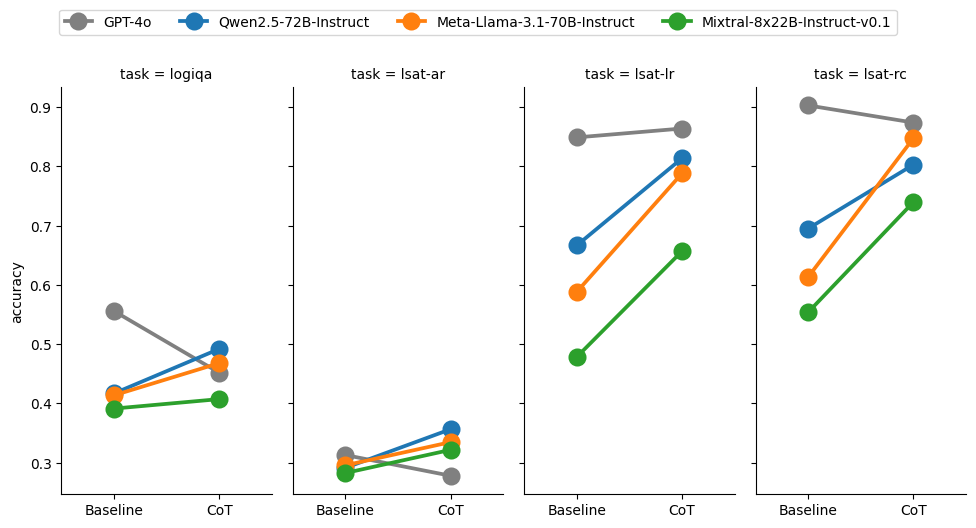

In [141]:
import seaborn as sns

g = sns.catplot(
    kind="point",
    data=df_top_models, x="regime", y="accuracy", hue="model",
    col="task",
    linestyle="-", errorbar=None,
    marker=".", markersize=20, markeredgewidth=3,
    palette=["gray"]+sns.color_palette("tab10"),
    legend="auto",
    aspect=.5,
)
g.set(xlabel=None)
sns.move_legend(g, "upper center", bbox_to_anchor=(.4, 1.1), ncol=4, title=None, frameon=True)
g.savefig("gpt4-vs-cot-leaderboard.png", bbox_inches="tight", dpi=300)